# Tendency segmentation
Plot the tendency and color the dots according the segment

In [1]:
import os
# fix root path to save outputs
actual_path = os.path.abspath(os.getcwd())
list_root_path = actual_path.split('\\')[:-1]
root_path = '\\'.join(list_root_path)
os.chdir(root_path)
print('root path: ', root_path)

root path:  D:\github-mi-repo\exploratory-data-analysis


### 0. Package and load data

In [2]:
from sklearn.datasets import fetch_california_housing
import json
import pandas as pd
import numpy as np

# plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

#### load data example segmentation
In this example there are the possible segmentation of the data to select:
- segmentation by target. custom segmentation. Price_segments
- segmentation by feature house age. custom segmentation. HouseAge_segments
- segmentation by MedInc. quintile segmentation. quartile_MedInc

In [3]:
# read data
data = pd.read_pickle('data/data_segmentation.pkl')

# define column that indice the segmentation of the data
column_segment = 'Price' + '_segments' # feature used to segment and the suffix "_segments"

# define the other segments that not use in the example
segments_not_use = ['HouseAge_segments', 'quartile_MedInc']
data.drop(columns = segments_not_use, inplace = True)

data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price,Price_segments
3130,4.8750,1.0,5.533333,1.000000,32.0,2.133333,35.08,-117.95,1.417,Low Price
19536,4.2500,1.0,20.125000,2.928571,402.0,3.589286,37.65,-120.93,1.892,Low Price
18972,5.2636,1.0,7.694030,1.279851,872.0,3.253731,38.23,-122.00,1.913,Low Price
12286,1.6250,1.0,3.000000,1.000000,8.0,4.000000,33.86,-116.95,0.550,Low Price
12077,6.2308,2.0,8.801008,1.373804,5964.0,3.004534,33.87,-117.64,2.579,Medium Price


# ----> IMPORTANT THIS EXAMPLE IT IS NOT A TIME SERIES, BUT CONSIDERING THAT THE DATA IS A TIMESERIES AND PLOT THE TENDENCY HAS SENSE

In [4]:
# get name of each segment in a list
unique_values_segments = data[column_segment].unique().tolist()
unique_values_segments = list(filter(pd.notna, unique_values_segments)) # delete null values in segments
unique_values_segments.sort()

### 1. codes to generate EDA

In [5]:
# show data
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price,Price_segments
3130,4.8750,1.0,5.533333,1.000000,32.0,2.133333,35.08,-117.95,1.41700,Low Price
19536,4.2500,1.0,20.125000,2.928571,402.0,3.589286,37.65,-120.93,1.89200,Low Price
18972,5.2636,1.0,7.694030,1.279851,872.0,3.253731,38.23,-122.00,1.91300,Low Price
12286,1.6250,1.0,3.000000,1.000000,8.0,4.000000,33.86,-116.95,0.55000,Low Price
12077,6.2308,2.0,8.801008,1.373804,5964.0,3.004534,33.87,-117.64,2.57900,Medium Price
...,...,...,...,...,...,...,...,...,...,...
15808,5.0731,52.0,5.248954,1.037657,855.0,1.788703,37.76,-122.44,4.05400,High Price
4117,5.5291,52.0,5.937984,1.049096,1203.0,3.108527,34.14,-118.22,2.74600,Medium Price
16017,6.7228,52.0,7.433249,1.022670,1115.0,2.808564,37.72,-122.46,4.05200,High Price
5121,3.0625,52.0,6.108959,1.113801,1167.0,2.825666,33.96,-118.31,1.27400,Low Price


In [6]:
# order data by index to plot the trend
data = data.sort_index()
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price,Price_segments
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,High Price
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,High Price
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,High Price
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,Medium Price
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,Medium Price
...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781,Low Price
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771,Low Price
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923,Low Price
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847,Low Price


In [7]:
feature_ = 'MedInc'

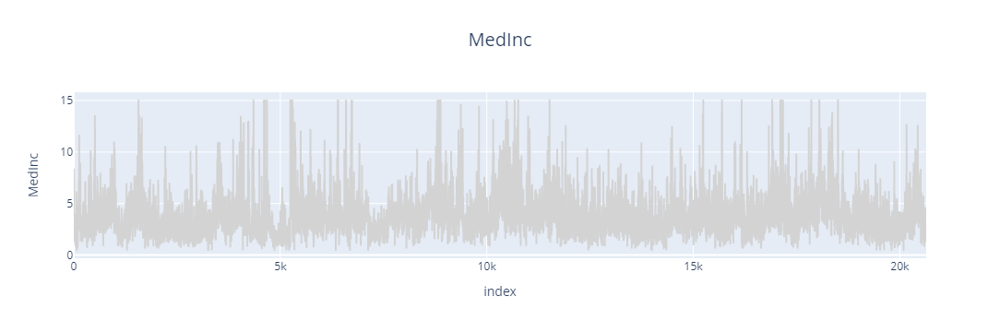

In [8]:
#### classic time series

# plot time series
fig = px.line(data, x = data.index, y = feature_, title = f'plot_{feature_}')

# update color to gray
fig.data[0]['line']['color'] = '#D3D3D3'

# update title
fig.update_layout(
  title_text = feature_,
  title_x = 0.5, # centrar titulo
  title_font = dict(size = 20)
)
fig.show()

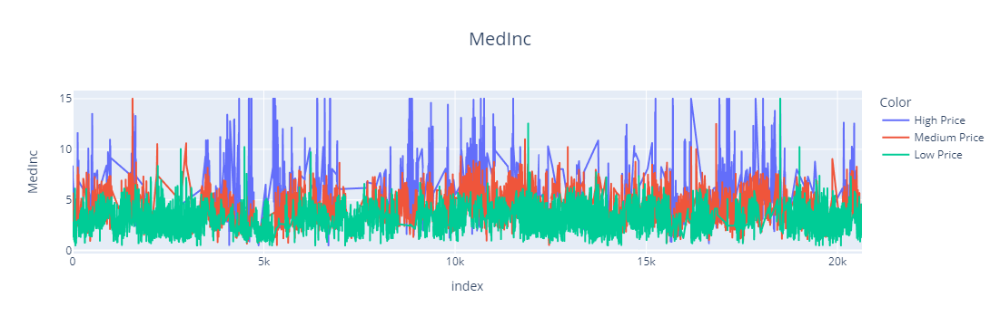

In [9]:
#### time series color according the segment - NOT WORK
fig = px.line(data, x=data.index, y=feature_, color='Price_segments', 
              title=f'Plot_{feature_}', labels={'Price_segments': 'Color'})
              
# Actualizar el título
fig.update_layout(
    title_text=feature_,
    title_x=0.5,  # centrar titulo
    title_font=dict(size=20)
)

fig.show()

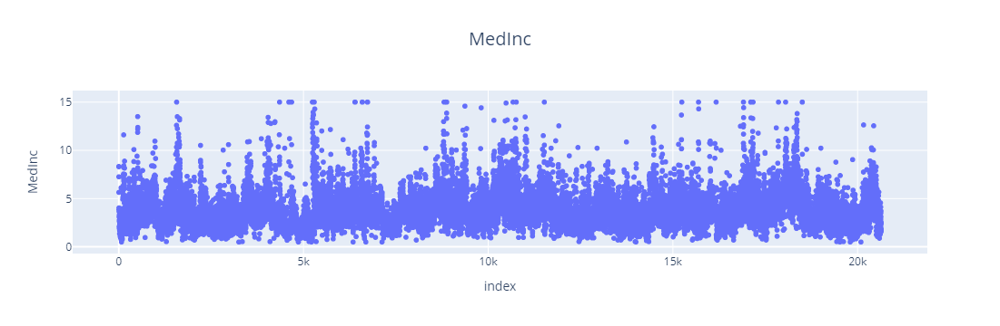

In [10]:
#### classic time series but doing with scatter plot instead of lines
# Crear scatter plot
fig = px.scatter(data, x=data.index, y=feature_, title=f'plot_{feature_}')

# Actualizar el diseño del título
fig.update_layout(
    title_text=feature_,
    title_x=0.5,  # centrar título
    title_font=dict(size=20)
)

# Mostrar el gráfico
fig.show()

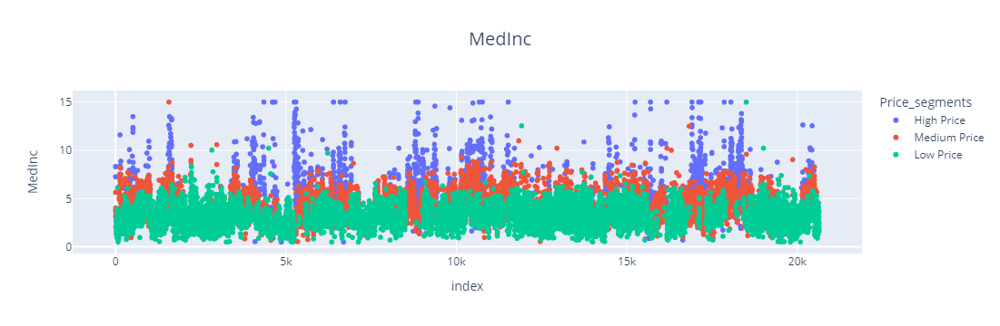

In [11]:
#### classic time series but doing with scatter plot instead of lines - color according segment
# Crear scatter plot
fig = px.scatter(data, x=data.index, y=feature_, title=f'plot_{feature_}', color = column_segment)

# Actualizar el diseño del título
fig.update_layout(
    title_text=feature_,
    title_x=0.5,  # centrar título
    title_font=dict(size=20)
)

# Mostrar el gráfico
fig.show()

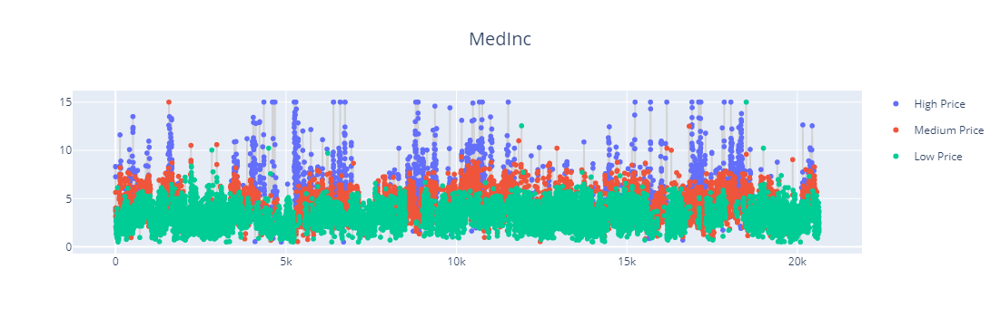

In [12]:
### the same scatter plot colored by segment and a gray line with the tendecy

# Create figure
fig = go.Figure()

# generate plot scatter color by segment
fig_scatter_segment = px.scatter(data, x=data.index, y=feature_, title=f'plot_{feature_}', color = column_segment)

# generate trend gray
fig_trend = px.line(data, x = data.index, y = feature_, title = f'plot_{feature_}')
fig_trend.data[0]['line']['color'] = '#D3D3D3'

# add to fig
fig.add_trace(fig_trend.data[0])
for index_segment in range(len(unique_values_segments)): # add each scatter plot for each segment
    fig.add_trace(fig_scatter_segment.data[index_segment])


# update layout
fig.update_layout(
    title_text=feature_,
    title_x=0.5,  # centrar título
    title_font=dict(size=20)
)

# Mostrar el gráfico
fig.show()

### 2. Codes to sinthesize

In [13]:
def plot_tendency_segment(df, feature_plot, var_segment):
    """
    Plot the individual tendency of a feature present in a dataframe. Color the tendency according the segment

    Args
        df (dataframe): data. The index should be the timestamp and the dataframe must be sorted by the index
        feature_plot (string): name of the feature that will be ploted
        var_segment (string): name of the variable that segment the data to color the scatter plot

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    
    # get name of each segment in a list
    unique_values_segments = df[var_segment].unique().tolist()
    unique_values_segments = list(filter(pd.notna, unique_values_segments)) # delete null values in segments
    unique_values_segments.sort()

    # Create figure
    fig = go.Figure()
    
    # generate plot scatter color by segment
    fig_scatter_segment = px.scatter(df, x=df.index, y=feature_plot, title=f'plot_{feature_plot}', color = var_segment, opacity = 0.7)
    
    # generate trend gray
    fig_trend = px.line(df, x = df.index, y = feature_plot, title = f'plot_{feature_plot}')
    fig_trend.data[0]['line']['color'] = '#D3D3D3'
    
    # add to fig
    fig.add_trace(fig_trend.data[0])
    for index_segment in range(len(unique_values_segments)): # add each scatter plot for each segment
        fig.add_trace(fig_scatter_segment.data[index_segment])
    
    
    # update layout
    fig.update_layout(
        title_text=feature_plot,
        title_x=0.5,  # centrar título
        title_font=dict(size=20)
    )
    
    return fig

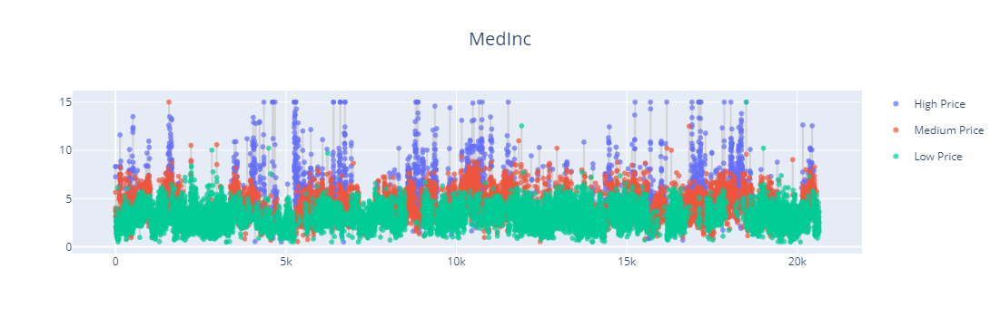

In [14]:
# example
fig_individual_trend_segment = plot_tendency_segment(df = data, 
                                             var_segment = 'Price_segments', 
                                             feature_plot = 'MedInc')

fig_individual_trend_segment.write_html("output_eda/4_segmentation_analysis/individual_trend_segmentation.html")

fig_individual_trend_segment.show()

In [15]:
def plot_multiple_tendency_segmentation(df, var_segment, number_columns = 2):
    """
    Plot multiple tendency for each feature in the dataframe
    
    Args
        df (dataframe): data. The index should be the timestamp and the dataframe must be sorted by the index
        number_columns (integer): number of columns, by default ONE column
        var_segment (string): name of the variable that segment the data to color the scatter plot

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    # get list of features
    list_features = df.columns.tolist()

    # get name of each segment in a list
    unique_values_segments = df[var_segment].unique().tolist()
    unique_values_segments = list(filter(pd.notna, unique_values_segments)) # delete null values in segments
    unique_values_segments.sort()

    # get number of rows (number row = number of data / number of columns)
    # (considering fixed the number of columns) 
    if (df.shape[1] % number_columns) != 0:
        number_rows = (df.shape[1] // number_columns) + 1 
    else:
        number_rows = (df.shape[1] // number_columns)


    ############################## 
    # create subplots
    fig = make_subplots(rows = number_rows, 
                        cols = number_columns, 
                        subplot_titles = tuple(list_features)
                       )

    # add subplot for each of the features -> feature
    for index_feature, feature in enumerate(list_features):
    
        # obtener índices en el subplot (en plotly los índices comienzan en 1, por lo que debe sumarse un 1 a los resultados obtenidos)
        row = (index_feature // number_columns) + 1
        column = (index_feature % number_columns) + 1

        # get trend gray with scatter plot of differets segments
        fig_scatter_segment = px.scatter(df, x=df.index, y=feature, color = var_segment, opacity = 0.7)
        fig_trend = px.line(df, x = df.index, y = feature)
        fig_trend.data[0]['line']['color'] = '#D3D3D3'
        
        # add the individual plot scatter-trend into a subplot
        fig.add_trace(fig_trend.data[0],  row = row, col = column)
        for index_segment in range(len(unique_values_segments)): ### add scatter plot segments
            fig.add_trace(fig_scatter_segment.data[index_segment], row = row, col = column)
        

  # change shape subplot
    fig.update_layout(
            height = 550 * number_rows, # largo
            width = 1850 * number_columns, # ancho
      title_text="Plots of tendency",
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 28)
      )
    
    ##############################

    
    return fig

In [16]:
fig_trend_segment = plot_multiple_tendency_segmentation(df = data, 
                                             var_segment = 'Price_segments', 
                                             number_columns = 1)

fig_trend_segment.write_html("output_eda/4_segmentation_analysis/trend_segmentation.html")

#fig_trend_segment.show()